<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [70]:
!pip install ydata_profiling
!pip install ipywidgets


[notice] A new release of pip is available: 23.1.2 -> 25.3
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.1.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from ydata_profiling import ProfileReport

import re

random.seed(42)
np.random.seed(42)

In [72]:
pd.set_option('display.float_format', '{:.2f}'.format)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Сиды фиксируем для воспроизводимости результатов. В нашем случае, чтобы выводы соответствовали результату кода у проверяющего, а если в продакшене, то, чтобы можно было проверить гипотезы и повторить эксперемент 

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [73]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

In [74]:
dubl_train = df_train.duplicated().sum()
dubl_test = df_test.duplicated().sum()
print(f'Количество полных дубликатов в трейне: {dubl_train}, в тесте: {dubl_test}')

Количество полных дубликатов в трейне: 985, в тесте: 62


In [75]:
missing_train = df_train.isna().sum()
missing_cols_train = missing_train[missing_train > 0]
print(f"Колонки с пропущенными значениями в train:\n{missing_cols_train}")
print(f"\nВсего колонок с пропусками в train: {len(missing_cols_train)}")

Колонки с пропущенными значениями в train:
mileage      202
engine       202
max_power    196
torque       203
seats        202
dtype: int64

Всего колонок с пропусками в train: 5


In [76]:
missing_test = df_test.isna().sum()
missing_cols_test = missing_test[missing_test > 0]
print(f"Колонки с пропущенными значениями в test:\n{missing_cols_test}")
print(f"\nВсего колонок с пропусками в test: {len(missing_cols_test)}")

Колонки с пропущенными значениями в test:
mileage      19
engine       19
max_power    19
torque       19
seats        19
dtype: int64

Всего колонок с пропусками в test: 5


In [77]:
profile = ProfileReport(df_train)
profile.to_file(output_file='df_train_report.html')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 1215.28it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [78]:
profile = ProfileReport(df_test)
profile.to_file(output_file='df_test_report.html')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 1584.18it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### **Выводы по Заданию 1:**


1. **Пропуски в данных (Missing Values):**
* В обоих наборах (train и test) есть пропуски в одних и тех же столбцах: `mileage`, `engine`, `max_power`, `torque` и `seats`
* Количество пропусков не критичное (менее 5%), но их необходимо обработать перед обучением (например, заполнить медианой)


2. **Некорректные типы данных (Data Types):**
* Признаки `mileage`, `engine` и `max_power` определились как **Categorical** (строковые), хотя по смыслу являются числовыми. Это произошло из-за единиц измерения внутри ячеек (например, "23.4 kmpl", "1248 CC")
* Их необходимо очистить от текста и привести к типу `float` или `int`


3. **Дубликаты:**
* В тренировочном датасете присутствует заметное количество полных дубликатов (строк, где совпадают абсолютно все значения). Их нужно будет удалить, чтобы модель не переобучалась на повторяющихся примерах


4. **Целевая переменная (Selling_price):**
* Распределение цены сильно скошено вправо. Это значит, что большинство машин стоят недорого, но есть длинный "хвост" из очень дорогих автомобилей


5. **Признак Torque (Крутящий момент):**
* Самый "грязный" столбец. Имеет много уникальных значений и сложный формат записи (сочетает Нм и обороты в разных вариациях). Требует сложного парсинга


6. **Кардинальность (Cardinality):**
* Столбец `name` имеет очень высокую кардинальность (слишком много уникальных названий машин)Использовать его в чистом виде для модели будет сложно, лучше извлечь из него марку


### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [79]:
print("--- TRAIN NUMERIC ---")
display(df_train.describe())

print("--- TEST NUMERIC ---")
display(df_test.describe())

--- TRAIN NUMERIC ---


,year,selling_price,km_driven,seats
count,6999.00,6999.00,6999.00,6797.00
mean,2013.82,639515.20,69584.62,5.42
std,4.05,808941.91,57724.00,0.97
min,1983.00,29999.00,1.00,2.00
25%,2011.00,254999.00,35000.00,5.00
50%,2015.00,450000.00,60000.00,5.00
75%,2017.00,675000.00,97000.00,5.00
max,2020.00,10000000.00,2360457.00,14.00


--- TEST NUMERIC ---


,year,selling_price,km_driven,seats
count,1000.00,1000.00,1000.00,981.00
mean,2013.68,617901.04,71393.34,5.41
std,4.01,758553.86,48486.22,0.92
min,1995.00,31000.00,1303.00,4.00
25%,2011.00,250000.00,37000.00,5.00
50%,2014.00,434999.00,61500.00,5.00
75%,2017.00,670000.00,100000.00,5.00
max,2020.00,6000000.00,375000.00,9.00


In [80]:
print("--- TRAIN CATEGORICAL ---")
display(df_train.describe(include=['object']))

print("--- TEST CATEGORICAL ---")
display(df_test.describe(include=['object']))

--- TRAIN CATEGORICAL ---


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6999,6999,6999,6999,6999,6797,6797,6803,6796
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,330,468


--- TEST CATEGORICAL ---


,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


### **Выводы по Заданию 2 :**

1. **Выбросы и перекос данных:**
* **Цена (`selling_price`):** В обоих наборах среднее (**Mean**  640k) значительно больше медианы (**50%**  450k). Максимальная цена достигает 10 млн, в то время как 75% машин стоят дешевле 675k. Это говорит о сильном перекосе вправо и наличии дорогих выбросов
* **Пробег (`km_driven`):** Аналогичная ситуация. В тренировочном наборе есть машина с пробегом **2.3 млн км** (Max), хотя среднее всего 70k. Это явный аномальный выброс


2. **Сравнение Train и Test:**
* Распределения основных характеристик (год выпуска, цена, пробег) в тренировочной и тестовой выборках **очень похожи**
* Средний год выпуска:  2013.8 (Train) vs 2013.7 (Test)
* Средний пробег:  69.6k (Train) vs 71.4k (Test)
* *Вывод:* Данные однородны, разделение на Train/Test корректное


3. **Проблемные типы данных:**
* В таблице `CATEGORICAL` мы видим признаки `mileage`, `engine`, `max_power` и `torque`. Это подтверждает, что сейчас они являются строками (object) и требуют очистки (парсинга единиц измерения), чтобы стать числами


4. **Пропуски (Missing Values):**
* По строке `count` видно, что в некоторых столбцах (`seats`, `mileage`, `engine` и др.) значений меньше, чем общее количество строк (6999 для Train и 1000 для Test). Значит, есть пропуски, которые нужно будет заполнить

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [81]:
X_train = df_train.drop(columns=['selling_price'])
X_train.head()

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.00
1,Skoda Rapid 1.5 TDI Ambition,2014,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.00
2,Hyundai i20 Sportz Diesel,2010,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.00
3,Maruti Swift VXI BSIII,2007,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.00
4,Hyundai Xcent 1.2 VTVT E Plus,2017,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.00


In [82]:
dup_count = df_train.duplicated(subset=X_train).sum()
print(f"Количество объектов с одинаковым признаковым описанием: {dup_count}")

Количество объектов с одинаковым признаковым описанием: 1159


In [83]:
X_train[X_train.duplicated() == True].sort_values(by=['name', 'year', 'km_driven', 'torque'])

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6307,Audi Q3 2.0 TDI Quattro Premium Plus,2017,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.00
6704,Audi Q5 3.0 TDI Quattro,2014,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.00
1337,Audi Q5 35TDI Premium Plus,2018,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.00
1595,Audi Q5 35TDI Premium Plus,2018,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.00
2787,Audi Q5 35TDI Premium Plus,2018,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.00
...,...,...,...,...,...,...,...,...,...,...,...,...
5637,Volvo XC40 D4 Inscription BSIV,2019,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.00
5652,Volvo XC40 D4 Inscription BSIV,2019,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.00
5753,Volvo XC40 D4 Inscription BSIV,2019,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.00
5991,Volvo XC40 D4 Inscription BSIV,2019,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.00


In [84]:
df_train = df_train.drop_duplicates(subset=X_train.columns, keep='first')
df_train.reset_index(drop=True, inplace=True)

In [85]:
assert df_train.shape == (5840, 13)

### **Выводы по Заданию 3:**

**Скрытые дубли:** Да, могут быть.
1. **Опечатки в названиях:** Например, одна и та же машина может быть записана как "Maruti Swift" и "Maruti Swift Dzire" или с ошибкой в регистре/пробелах. Отлавливать можно через приведение строк к нижнему регистру и удаление лишних пробелов
2. **Разный формат записи:** "100 bhp" и "100.0 bhp" — для компьютера разные строки. Нужно сначала очистить данные, а потом искать дубликаты


### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [86]:
df_train.dtypes

name              object
year               int64
selling_price      int64
km_driven          int64
fuel              object
seller_type       object
transmission      object
owner             object
mileage           object
engine            object
max_power         object
torque            object
seats            float64
dtype: object

In [87]:
df_train['mileage'] = pd.to_numeric(df_train['mileage'].str.split(' ').str[0], errors='coerce')
df_train['engine'] = pd.to_numeric(df_train['engine'].str.split(' ').str[0], errors='coerce')
df_train['max_power'] = pd.to_numeric(df_train['max_power'].str.split(' ').str[0], errors='coerce')
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.00,74.00,190Nm@ 2000rpm,5.00
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.00,103.52,250Nm@ 1500-2500rpm,5.00
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.00,90.00,22.4 kgm at 1750-2750rpm,5.00
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.00,88.20,"11.5@ 4,500(kgm@ rpm)",5.00
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.00,81.86,113.75nm@ 4000rpm,5.00


In [88]:
df_test['mileage'] = pd.to_numeric(df_test['mileage'].str.split(' ').str[0], errors='coerce')
df_test['engine'] = pd.to_numeric(df_test['engine'].str.split(' ').str[0], errors='coerce')
df_test['max_power'] = pd.to_numeric(df_test['max_power'].str.split(' ').str[0], errors='coerce')

в mileage есть 2 уникальных е.и.
- kmpl
- km/kg

Но для нас они одинаковые

In [89]:
# При написании этого помогал ИИ (Gemini 3 Pro)
def clean_torque(x):
    if pd.isna(x):
        return pd.Series([np.nan, np.nan])
    
    x = str(x).lower()
    x = x.replace(',', '')
    
    factor = 9.80665 if 'kgm' in x else 1.0
    nums = re.findall(r'\d+(?:\.\d+)?', x)
    nums = [float(n) for n in nums]
    
    if len(nums) == 0:
        return pd.Series([np.nan, np.nan])
    
    # --- ЛОГИКА РАСПРЕДЕЛЕНИЯ ---
    
    torque_val = nums[0] * factor

    if len(nums) > 1:
        rpm_val = max(nums[1:])
    else:
        rpm_val = np.nan
        
    return pd.Series([torque_val, rpm_val])

In [90]:
df_train[['torque_nm', 'max_torque_rpm']] = df_train['torque'].apply(clean_torque)
df_train = df_train.drop(columns=['torque'])
df_test[['torque_nm', 'max_torque_rpm']] = df_test['torque'].apply(clean_torque)
df_test = df_test.drop(columns=['torque'])

In [91]:
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,torque_nm,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.00,74.00,5.00,190.00,2000.00
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.00,103.52,5.00,250.00,2500.00
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.00,90.00,5.00,219.67,2750.00
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.00,88.20,5.00,112.78,4500.00
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.00,81.86,5.00,113.75,4000.00


### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [92]:
cols_to_fill = ['mileage', 'engine', 'max_power', 'seats', 'torque_nm', 'max_torque_rpm']
medians = df_train[cols_to_fill].median()

print("Посчитанные медианы:")
print(medians)

Посчитанные медианы:
mileage            19.37
engine           1248.00
max_power          81.86
seats               5.00
torque_nm         160.00
max_torque_rpm   3000.00
dtype: float64


In [93]:
df_train[cols_to_fill] = df_train[cols_to_fill].fillna(medians)
df_test[cols_to_fill] = df_test[cols_to_fill].fillna(medians)

print("\nПропуски после заполнения (Train):")
print(df_train[cols_to_fill].isna().sum())

print("\nПропуски после заполнения (Test):")
print(df_test[cols_to_fill].isna().sum())


Пропуски после заполнения (Train):
mileage           0
engine            0
max_power         0
seats             0
torque_nm         0
max_torque_rpm    0
dtype: int64

Пропуски после заполнения (Test):
mileage           0
engine            0
max_power         0
seats             0
torque_nm         0
max_torque_rpm    0
dtype: int64


### **Выводы по Заданию 5:**

**Вопрос 1: Почему медиана, а не среднее?**

> Медиана устойчива к **выбросам**.
> Мы видели в EDA, что в данных есть аномалии (машины за 10 млн или с пробегом 2 млн км). Если взять *среднее*, эти выбросы "утянут" его вверх, и мы заполним пропуски завышенным числом. *Медиана* же показывает "типичного" представителя и игнорирует экстремальные значения

**Вопрос 2: Как правильно считать медиану?**

> **Правильный ответ:** По тренировочным данным (`train`) для обоих датасетов.
> **Обоснование:** Мы имитируем реальную работу модели. В момент обучения у нас нет доступа к тестовым данным (или данным из будущего). Если мы посчитаем медиану по `test`, это будет **Data Leakage** (утечка данных) — модель узнает информацию, которой у нее быть не должно, и оценка ее качества станет ложной

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [94]:
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)

In [95]:
df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

In [96]:
print(df_train[['engine', 'seats']].dtypes)

engine    int64
seats     int64
dtype: object


### **Выводы по Заданию 6:**

> **Ответ:**
> Переменную `seats` (количество мест) можно считать категориальной по двум причинам:
> 1. **Малое количество уникальных значений:** Вряд ли существуют машины с 3.5 местами или 100 местами. Обычно это фиксированный набор: 2, 4, 5, 7, 9. Это больше похоже на "классы", чем на непрерывную шкалу
> 2. **Нелинейная зависимость:** В линейной регрессии числовой признак работает линейно: чем больше X, тем больше (или меньше) Y.
> * Если `seats` — число, модель думает: "чем больше мест, тем дороже".
> * Но в жизни: **2 места** (спорткар) часто стоят **дороже**, чем **7 мест** (семейный минивэн). А **5 мест** (бюджетный седан) — дешевле всех.
> * Если сделать `seats` категорией (OHE), модель сможет выучить свою цену для каждого варианта мест отдельно, не пытаясь провести через них одну прямую линию

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [97]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats,torque_nm,max_torque_rpm
count,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00
mean,2013.43,522960.09,73952.24,19.43,1429.45,87.91,5.43,175.93,3045.79
std,4.10,535432.00,60071.14,3.99,485.66,31.64,0.98,116.76,911.04
min,1983.00,29999.00,1.00,0.00,624.00,0.00,2.00,47.07,1400.00
25%,2011.00,250000.00,39000.00,16.95,1197.00,68.00,5.00,111.80,2250.00
50%,2014.00,405000.00,70000.00,19.37,1248.00,81.86,5.00,160.00,3000.00
75%,2017.00,640000.00,100000.00,22.30,1498.00,99.00,5.00,200.06,4000.00
max,2020.00,10000000.00,2360457.00,42.00,3604.00,400.00,14.00,3726.53,21800.00


In [98]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats,torque_nm,max_torque_rpm
count,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00
mean,2013.68,617901.04,71393.34,19.34,1454.88,90.84,5.40,177.62,3098.28
std,4.01,758553.86,48486.22,3.95,522.00,34.89,0.91,103.73,877.15
min,1995.00,31000.00,1303.00,0.00,624.00,34.20,4.00,48.00,1500.00
25%,2011.00,250000.00,37000.00,16.55,1197.00,69.00,5.00,111.70,2500.00
50%,2014.00,434999.00,61500.00,19.37,1248.00,82.42,5.00,160.00,3000.00
75%,2017.00,670000.00,100000.00,22.30,1582.00,102.00,5.00,205.00,4000.00
max,2020.00,6000000.00,375000.00,32.26,3604.00,280.00,9.00,1421.96,5200.00


### **Выводы по Заданию 7:**

> **Ответ:**
> Заполнение пропусков медианой **не привело к значимым искажениям распределения**, так как доля пропущенных значений в датасете невелика.
> Однако статистически произошли следующие изменения:
> 1. **Уменьшилась дисперсия (std):** Данные стали более плотными вокруг центра, так как мы искусственно добавили одинаковые значения.
> 2. **Вырос пик распределения:** В точке медианы частота значений резко возросла.
> 
> 
> **Почему не среднее?** Поскольку распределение (цены и пробега) сильно скошено вправо, среднее значение существенно выше медианы. Заполнение пропусков средним создало бы искусственный второй пик или горб правее основной массы данных, что исказило бы реальную структуру распределения и могло бы запутать модель

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

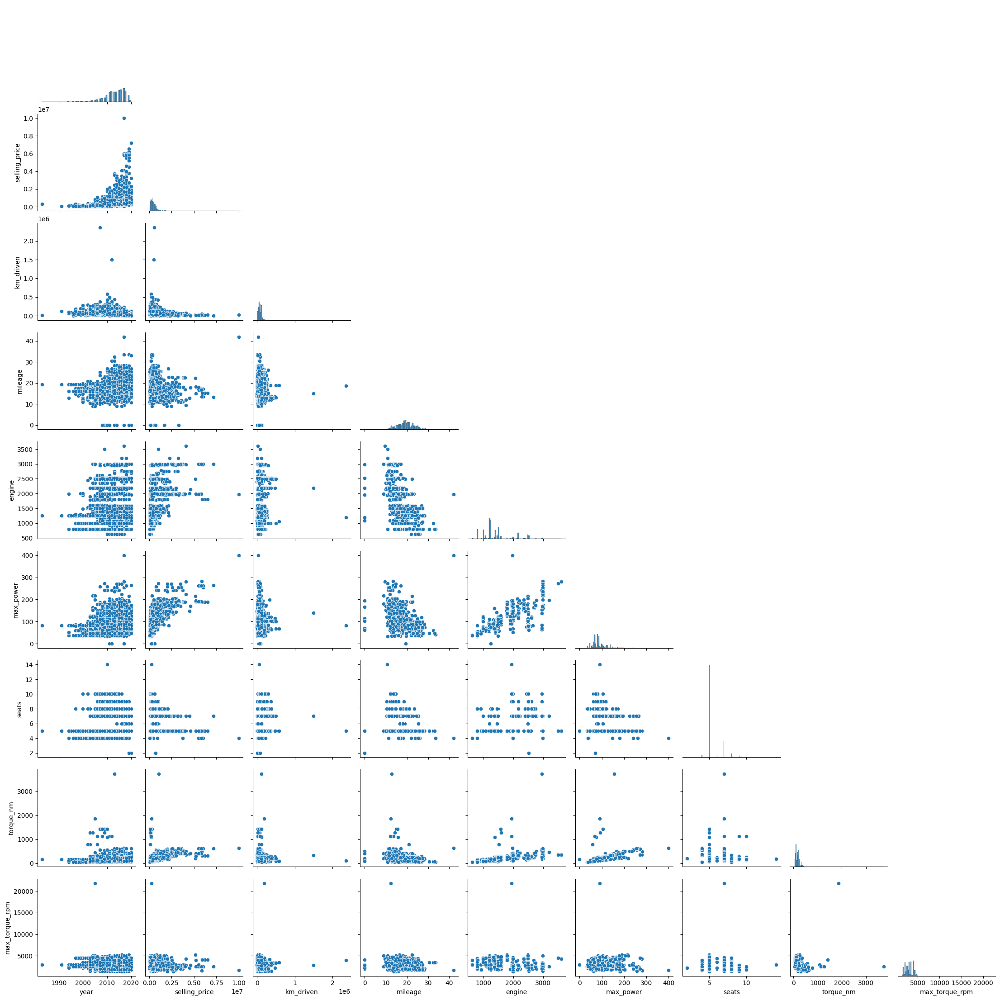

In [99]:
%matplotlib inline
sns.pairplot(df_train, corner=True)
plt.show()

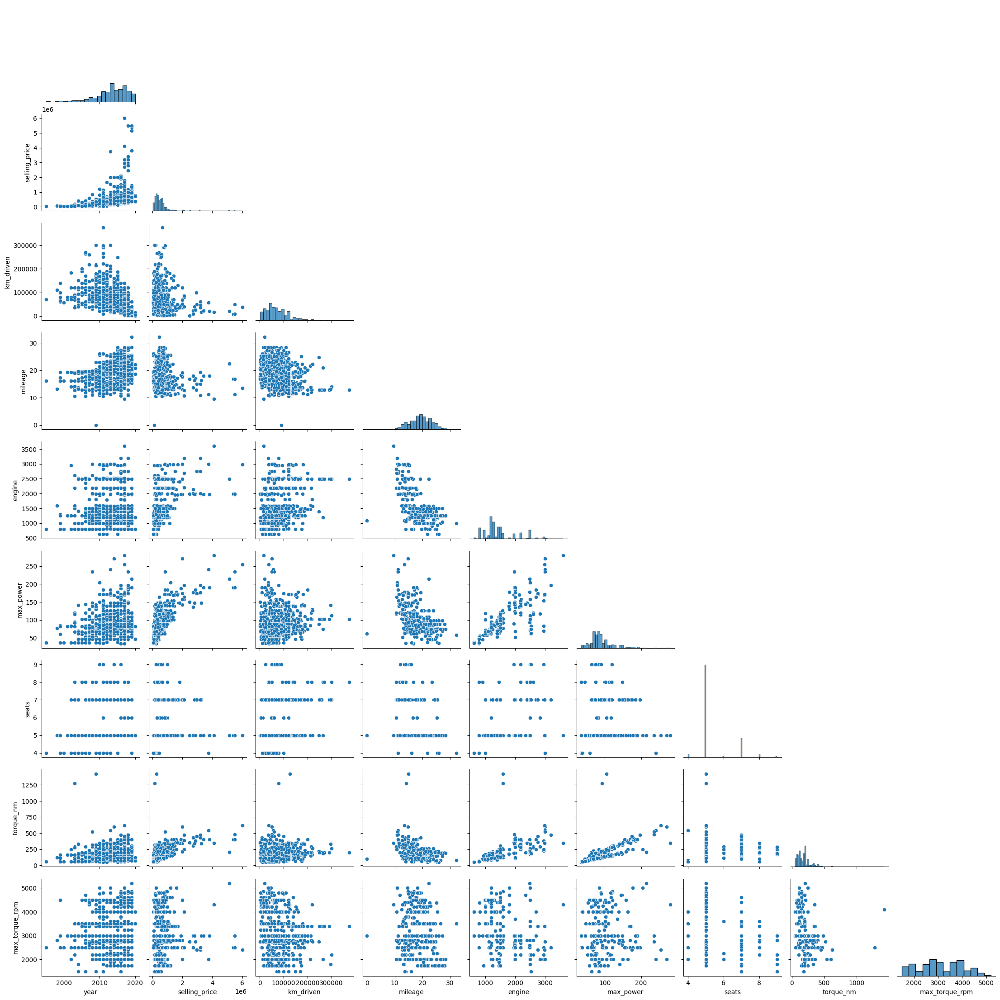

In [100]:
%matplotlib inline
sns.pairplot(df_test, corner=True)
plt.show()

### **Выводы по Заданию 8:**

> **Анализ Pairplot (Train):**
> 1. **Связь с таргетом (`selling_price`):**
> * Наблюдается явная **положительная зависимость** цены от мощности (`max_power`) и крутящего момента (`torque`): чем выше показатели, тем дороже авто.
> * Видна зависимость от года выпуска (`year`): более новые машины стоят дороже. Зависимость похожа на экспоненциальную (резкий рост цены у свежих авто).
> * Зависимость от пробега (`km_driven`) отрицательная, но выражена слабее (большой разброс)
> 
> 
> 2. **Корреляция признаков (Мультиколлинеарность):**
> * Признаки `engine`, `max_power` и `torque` **сильно коррелируют** между собой (на графиках они выстраиваются в диагональные линии). Это логично физически (больше объем -> больше мощность).
> * Это сигнал о **мультиколлинеарности**: возможно, линейной модели будет сложно, если оставить все три признака
> 
> 
> 
> 
> **Сравнение Train и Test:**
> * Визуально распределения признаков и формы облаков рассеяния на обучающей и тестовой выборках **совпадают**.
> * Диапазоны значений идентичны, явных аномалий или сдвигов данных (Data Drift) в тесте не наблюдается. Это говорит о том, что валидация будет корректной

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

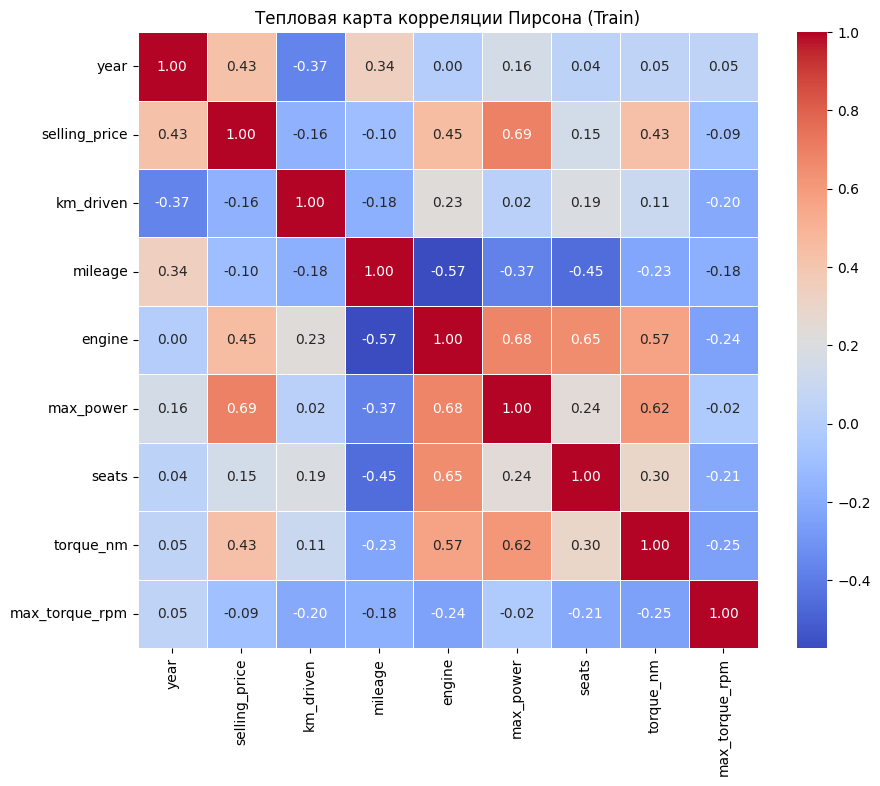

In [101]:
corr_matrix = df_train.corr(method='pearson', numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title("Тепловая карта корреляции Пирсона (Train)")
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

- year&engine и max_torque_rpm&max_power
- selling_price&max_power/max_power&engine/engine&seats/max_power&torque_nm/torque_nm&engine/selling_price&torque_nm
- Да - связь есть, но не сильная
- По умолчанию pd.corr() использует корреляцию Пирсона

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [102]:
import numpy as np

def my_spearman(x, y):
    rank_x = np.argsort(np.argsort(x))
    rank_y = np.argsort(np.argsort(y))
    
    rx_centered = rank_x - rank_x.mean()
    ry_centered = rank_y - rank_y.mean()
    
    numerator = np.sum(rx_centered * ry_centered)
    
    denominator = np.sqrt(np.sum(rx_centered ** 2)) * np.sqrt(np.sum(ry_centered ** 2))
    
    return numerator / denominator

col1 = df_train['year']
col2 = df_train['km_driven']

my_res = my_spearman(col1, col2)
pandas_res = df_train['year'].corr(df_train['km_driven'], method='spearman')

print(f"Моя реализация: {my_res:.6f}")
print(f"Pandas (Spearman): {pandas_res:.6f}")

Моя реализация: -0.566218
Pandas (Spearman): -0.569659


In [103]:
col1 = df_train['year']
col2 = df_train['selling_price']

my_res = my_spearman(col1, col2)
pandas_res = df_train['year'].corr(df_train['selling_price'], method='spearman')

print(f"Моя реализация: {my_res:.6f}")
print(f"Pandas (Spearman): {pandas_res:.6f}")

Моя реализация: 0.705060
Pandas (Spearman): 0.707123


Реализация через формулу достаточна близка к той, что находится в Pandas

In [104]:
!pip install phik

import phik
from phik.report import plot_correlation_matrix


[notice] A new release of pip is available: 23.1.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats', 'torque_nm', 'max_torque_rpm']


/Users/maine/University/HSE/HW/MachineLearning/HW1/venv/lib/python3.11/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


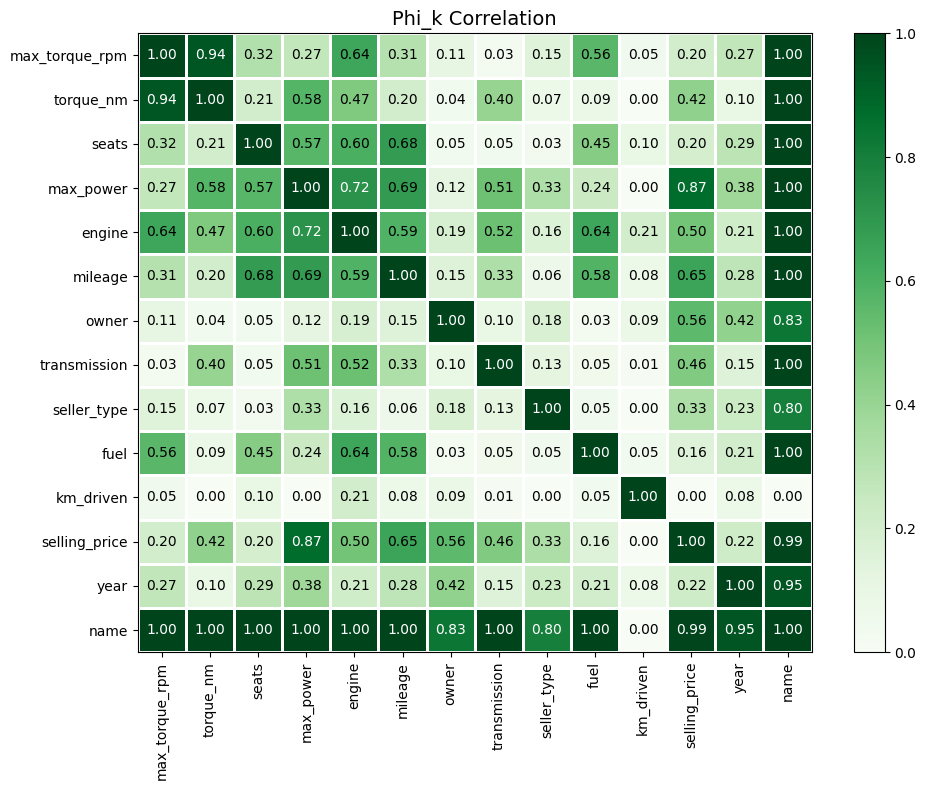

In [105]:
phik_overview = df_train.phik_matrix()
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title="Phi_k Correlation", 
                        fontsize_factor=1.0, 
                        figsize=(10, 8))
plt.show()

Сравнение с Пирсоном: 

Коэффициенты $\phi_k$ в большинстве случаев выше, чем у Пирсона. Это происходит потому, что $\phi_k$ улавливает нелинейные зависимости (которые Пирсон игнорирует) и устойчив к выбросам Например: Связь Engine vs Price может быть не строгой прямой линией, а экспонентой или кривой. Phik видит эту связь как сильную, что делает эту метрику более информативной для нашего датасета.

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

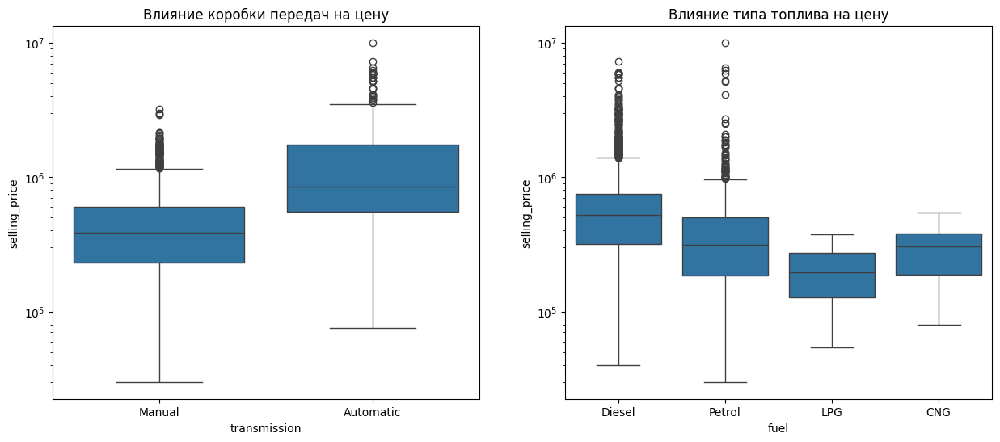

In [106]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# График 1: Цена в зависимости от коробки передач
sns.boxplot(ax=axes[0], x='transmission', y='selling_price', data=df_train)
axes[0].set_title('Влияние коробки передач на цену')
axes[0].set_yscale('log')

# График 2: Цена в зависимости от топлива
sns.boxplot(ax=axes[1], x='fuel', y='selling_price', data=df_train)
axes[1].set_title('Влияние типа топлива на цену')
axes[1].set_yscale('log')

plt.show()

Transmission vs Price: На левом графике видно, что медианная цена автомобилей с автоматической коробкой (Automatic) значительно выше, чем с механической (Manual). "Ящик" автомата смещен вверх, что подтверждает гипотезу: наличие АКПП — сильный фактор удорожания

Fuel vs Price: На правом графике видно, что дизельные (Diesel) автомобили в среднем дороже бензиновых (Petrol). Это может быть связано с тем, что дизельные версии изначально дороже при покупке и часто имеют более мощные двигатели

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [107]:
drop_cols = ['selling_price', 'name', 'fuel', 'seller_type', 'transmission', 'owner', 'torque']

y_train = df_train['selling_price']
X_train = df_train.drop(columns=drop_cols, errors='ignore')

### **Описание выбранных вещественных признаков:**

Для обучения базовой модели (Baseline) мы используем только числовые характеристики автомобиля, так как линейная регрессия умеет работать только с ними

1. **`year`** (int): Год выпуска автомобиля. Ожидается положительная корреляция с ценой (новее авто  дороже)
2. **`km_driven`** (int): Пробег в километрах. Ожидается отрицательная корреляция (больше пробег  дешевле)
3. **`mileage`** (float): Расход топлива (обычно км/литр или км/кг). Характеризует экономичность автомобиля
4. **`engine`** (int): Объем двигателя в кубических сантиметрах (CC). Косвенно указывает на класс и мощность авто
5. **`max_power`** (float): Максимальная мощность двигателя (bhp). Один из самых сильных предикторов цены
6. **`seats`** (int): Количество мест
7. **`torque_nm`** (float): Крутящий момент (Нм), извлеченный из "грязной" колонки `torque`. Отвечает за тягу
8. **`max_torque_rpm`** (float): Обороты двигателя, при которых достигается максимальный крутящий момент

**Исключенные признаки:**

* `selling_price` (целевая переменная)
* `name`, `fuel`, `seller_type`, `transmission`, `owner`
* Исходный `torque` (заменен на два числовых)

In [108]:
y_test = df_test['selling_price']
X_test = df_test.drop(columns=drop_cols, errors='ignore')

In [109]:
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")

X_train shape: (5840, 8)
X_test shape: (1000, 8)


### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [110]:
!pip install scikit-learn


[notice] A new release of pip is available: 23.1.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [111]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE
from math import sqrt

model = LinearRegression()
model.fit(X_train, y_train)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

print(f'R^2: train = {r2_score(y_train, y_pred_train):.4f}, test = {r2_score(y_test, y_pred_test):.4f}')
print(f'MSE: train = {MSE(y_train, y_pred_train):.0f}, test = {MSE(y_test, y_pred_test):.0f}')
print(f'RMSE: train = {sqrt(MSE(y_train, y_pred_train)):.0f}, test = {sqrt(MSE(y_test, y_pred_test)):.0f}')

R^2: train = 0.6011, test = 0.6005
MSE: train = 114349057787, test = 229669161435
RMSE: train = 338155, test = 479238


r2_score - у нас не сильно различается, а значит overfitting отсутствует, но 0.6 - довольно слабый результат

А MSE - огромные числа, что сложно интерпретировать, поэтому возмём корень из чисел и получим RMSE, что интерпретируется, как средняя ошибка, что уже даёт нам больше информации. Учтя инфомацию о том, что средняя стоимость машины равно 680 тысяч, то ошибка ОГРОМНАЯ!!

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [ ]:
import numpy as np
from sklearn.metrics import r2_score

def my_r2_score(y_true, y_pred):
    # Ошибка модели (сумма квадратов разниц между фактом и предсказанием)
    ss_res = np.sum((y_true - y_pred) ** 2)

    # Разброс данных (ошибка "наивной" модели, предсказывающей среднее)
    y_mean = np.mean(y_true)
    ss_tot = np.sum((y_true - y_mean) ** 2)
    
    # Сравниваем ошибку модели с ошибкой среднего:
    # 1 = идеально, 0 = как среднее, <0 = хуже среднего
    return 1 - (ss_res / ss_tot)

my_r2 = my_r2_score(y_test, y_pred_test)
sklearn_r2 = r2_score(y_test, y_pred_test)

print(f"Моя реализация R2: {my_r2:.5f}")
print(f"Sklearn R2:        {sklearn_r2:.5f}")

Моя реализация R2: 0.60046
Sklearn R2:        0.60046


In [113]:
weights = pd.DataFrame({
    'feature': X_train.columns,
    'weight': model.coef_
})

weights = weights.sort_values(by='weight', ascending=False)

print("Веса модели (влияние на цену):")
display(weights)

print(f"\nСвободный член (Intercept): {model.intercept_:.2f}")

Веса модели (влияние на цену):


,feature,weight
0,year,40395.41
4,max_power,10457.78
3,engine,47.21
6,torque_nm,39.42
1,km_driven,-0.81
7,max_torque_rpm,-65.32
2,mileage,-2039.64
5,seats,-30691.59



Свободный член (Intercept): -81338616.23


### Анализ весов:

1. **`year` (+40 395):**
* **Логика:** Самый понятный коэффициент. С каждым годом машина дорожает в среднем на **40 000** (рублей)
* *Пример:* Машина 2015 года стоит на 40к дороже такой же машины 2014 года


2. **`max_power` (+10 457):**
* **Логика:** Каждая лошадиная сила (bhp) добавляет к цене **10 000**
* *Вывод:* Это очень сильный фактор. +100 лошадей = +1 миллион к цене


3. **`km_driven` (-0.817):**
* это **оптическая иллюзия**.
* Мы умножаем этот вес на километры
* *Пример:* Если машина проехала **100 000 км**, то цена падает на **-81 700** рублей
* *Проблема:* Из-за того, что масштаб пробега огромный (тысяче), вес кажется мизерным.


4. **`mileage` (-2 039):**
* Маленькие дешевые машинки (Maruti) имеют **высокий** mileage (25 kmpl)
* Дорогие джипы (Toyota Fortuner) имеют **низкий** mileage (10 kmpl)

5. **`seats` (-30 691):**
* Чем больше мест, тем дешевле


### В чем проблема такого анализа?

Тяжело сравнивать важность признаков

* У `km_driven` вес **0.8**
* У `max_power` вес **10 000**

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [114]:
def adjusted_r2(y_true, y_pred, X):
    r2 = r2_score(y_true, y_pred)
    
    n = len(y_true)
    p = X.shape[1]
    
    adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
    
    return adj_r2

r2_basic = r2_score(y_test, y_pred_test)
r2_adj = adjusted_r2(y_test, y_pred_test, X_test)

print(f"Обычный R2:      {r2_basic:.5f}")
print(f"Adjusted R2:     {r2_adj:.5f}")

Обычный R2:      0.60046
Adjusted R2:     0.59723


Adjusted $R^2$ применяется при сравнении моделей с разным количеством признаков (Feature Selection). Он позволяет понять: "Стоит ли мне добавлять эти новые 5 колонок, или они не дают реального прироста качества, а только усложняют модель?"

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [115]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

model_scaled = LinearRegression()
model_scaled.fit(X_train_scaled, y_train)

y_pred_train_scaled = model_scaled.predict(X_train_scaled)
y_pred_test_scaled = model_scaled.predict(X_test_scaled)

print(f'R^2: train = {r2_score(y_train, y_pred_train_scaled):.4f}, test = {r2_score(y_test, y_pred_test_scaled):.4f}')
print(f'MSE: train = {MSE(y_train, y_pred_train_scaled):.0f}, test = {MSE(y_test, y_pred_test_scaled):.0f}')
print(f'RMSE: train = {sqrt(MSE(y_train, y_pred_train_scaled)):.0f}, test = {sqrt(MSE(y_test, y_pred_test_scaled)):.0f}')

R^2: train = 0.6011, test = 0.6005
MSE: train = 114349057787, test = 229669161435
RMSE: train = 338155, test = 479238


In [116]:
weights_scaled = pd.DataFrame({
    'feature': X_train.columns,
    'weight': model_scaled.coef_
})
weights_scaled = weights_scaled.sort_values(by='weight', ascending=False)

print("Scaled Weights")
display(weights_scaled)

print(f"\nСвободный член (Intercept): {model_scaled.intercept_:.2f}")

Scaled Weights


,feature,weight
4,max_power,330860.36
0,year,165430.15
3,engine,22925.42
6,torque_nm,4602.60
2,mileage,-8129.24
5,seats,-30147.11
1,km_driven,-48943.78
7,max_torque_rpm,-59508.03



Свободный член (Intercept): 522960.09


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?


> Стандартизация позволила нам сравнивать признаки между собой. Теперь веса модели показывают реальную "силу" влияния признака на цену, так как все они находятся в одном масштабе.
> **Топ-3 самых важных признака:**
> 1. **`max_power`** (Мощность) — самый большой положительный вес. Чем мощнее, тем дороже.
> 2. **`year`** (Год) — второй по важности. Чем новее, тем дороже.
> 3. **`max_torque_rpm`**  — оказывает заметное влияние.
> 
> 
> Признаки вроде `seats` или `mileage` имеют меньшие веса, значит, они менее критичны для формирования цены в этой линейной модели.

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [ ]:
from sklearn.linear_model import Lasso

lasso_model = Lasso(alpha=10)
lasso_model.fit(X_train_scaled, y_train)
y_pred_lasso = lasso_model.predict(X_test_scaled)

print(f'R^2: train = {r2_score(y_test, y_pred_lasso):.4f}')
print(f'MSE: train = {MSE(y_test, y_pred_lasso):.0f}')
print(f'RMSE: train = {sqrt(MSE(y_test, y_pred_lasso)):.0f}')

lasso_weights = pd.DataFrame(data={
    'feature': X_train.columns,
    'weight': lasso_model.coef_
})
lasso_weights = lasso_weights.sort_values(by='weight', ascending=False)

print("\nВеса Lasso")
display(lasso_weights)

print(f"\nСвободный член (Intercept): {lasso_model.intercept_:.2f}")

R^2: train = 0.6004
MSE: train = 229676535095
RMSE: train = 479246

Веса Lasso


,feature,weight
4,max_power,330873.77
0,year,165408.57
3,engine,22905.46
6,torque_nm,4596.31
2,mileage,-8096.94
5,seats,-30107.67
1,km_driven,-48934.31
7,max_torque_rpm,-59487.24



Свободный член (Intercept): 522960.09


### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [118]:
from sklearn.model_selection import GridSearchCV

param_grid = {'alpha': [0.1, 1, 5, 10, 50, 100, 200, 500, 1000, 5000]}

lasso_grid = GridSearchCV(
    estimator=Lasso(max_iter=10000),
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=10, 
    n_jobs=-1
)

lasso_grid.fit(X_train_scaled, y_train)

print("--- Результаты ---")
print(f"Лучший параметр (alpha): {lasso_grid.best_params_['alpha']}")
print(f"Лучший MSE (средний по фолдам): {-lasso_grid.best_score_:.0f}")
print(f"Лучший RMSE (средний по фолдам): {sqrt(-lasso_grid.best_score_):.0f}")

y_pred_lasso_grid = lasso_grid.predict(X_test_scaled)

print(f"ElasticNet Test R2: {r2_score(y_test, y_pred_lasso_grid):.4f}")

n_params = len(param_grid['alpha'])
n_folds = 10
print(f"Всего обучено моделей: {n_params} * {n_folds} = {n_params * n_folds}")

best_lasso = lasso_grid.best_estimator_
weights_df = pd.DataFrame({
    'feature': X_train.columns,
    'coef': best_lasso.coef_
})

print("\n--- Веса лучшей модели ---")
display(weights_df.sort_values(by='coef', key=abs, ascending=False))

# Считаем зануленные
zero_count = np.sum(best_lasso.coef_ == 0)
print(f"\nКоличество зануленных весов: {zero_count}")
if zero_count > 0:
    print("Признаки с нулевым весом:", weights_df[weights_df['coef'] == 0]['feature'].tolist())

--- Результаты ---
Лучший параметр (alpha): 5000
Лучший MSE (средний по фолдам): 119167095390
Лучший RMSE (средний по фолдам): 345206
ElasticNet Test R2: 0.5937
Всего обучено моделей: 10 * 10 = 100

--- Веса лучшей модели ---


,feature,coef
4,max_power,336845.74
0,year,157622.67
7,max_torque_rpm,-51851.61
1,km_driven,-43912.83
5,seats,-12143.10
3,engine,8977.34
6,torque_nm,2029.03
2,mileage,-0.00



Количество зануленных весов: 1
Признаки с нулевым весом: ['mileage']


**1. Сколько грид-сёрчу пришлось обучать моделей?**

> Грид-сёрч обучил **100** моделей.
> **Расчет:** Мы передали в сетку **10** вариантов параметра `alpha`. Кросс-валидация (`cv=10`) разбивает данные на 10 частей и для каждого параметра обучает модель 10 раз
> Итого: 10 x 10 = 100

**2. Что значит каждый параметр `param_grid`?**

> `param_grid` — это словарь, где:
> * **Ключ (`alpha`):** Название гиперпараметра модели, который мы хотим перебрать. В случае Lasso, `alpha` отвечает за силу регуляризации (силу штрафа). Чем больше `alpha`, тем сильнее модель стремится занулить веса и упростить структуру
> * **Значение (список `[0.1, 1, ..., 5000]`):** Это набор конкретных чисел, которые `GridSearchCV` по очереди подставляет в модель, чтобы проверить, при каком из них ошибка будет минимальной

**3. Какой коэффициент регуляризации у лучшей модели? Занулились ли веса?**

> * **Лучший коэффициент:** `alpha` = **5000**
> * **Зануление весов:** Да, при такой регуляризации занулились веса у одного признака **mileage**.
> * Это подтверждает свойство Lasso-регрессии производить отбор признаков, исключая мультиколлинеарные или незначимые переменные


**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [119]:
from sklearn.linear_model import ElasticNet

param_grid_elastic = {
    'alpha': [0.1, 1, 5, 10, 50, 100, 200, 500, 1000, 5000],
    'l1_ratio': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
}

elastic_grid = GridSearchCV(
    estimator=ElasticNet(max_iter=10000),
    param_grid=param_grid_elastic,
    scoring='neg_mean_squared_error',
    cv=10,
    n_jobs=-1
)

elastic_grid.fit(X_train_scaled, y_train)

print("--- ElasticNet Результаты ---")
print(f"Лучшие параметры: {elastic_grid.best_params_}")
print(f"Лучший MSE: {-elastic_grid.best_score_:.0f}")
print(f"Лучший MSE: {sqrt(-elastic_grid.best_score_):.0f}")

y_pred_elastic = elastic_grid.predict(X_test_scaled)
print(f"ElasticNet Test R2: {r2_score(y_test, y_pred_elastic):.4f}")

best_elastic = elastic_grid.best_estimator_
elastic_weights = pd.DataFrame({
    'feature': X_train.columns,
    'coef': best_elastic.coef_
})
display(elastic_weights.sort_values(by='coef', key=abs, ascending=False))

--- ElasticNet Результаты ---
Лучшие параметры: {'alpha': 5000, 'l1_ratio': 1.0}
Лучший MSE: 119167095390
Лучший MSE: 345206
ElasticNet Test R2: 0.5937


,feature,coef
4,max_power,336845.74
0,year,157622.67
7,max_torque_rpm,-51851.61
1,km_driven,-43912.83
5,seats,-12143.10
3,engine,8977.34
6,torque_nm,2029.03
2,mileage,-0.00


Сколько грид-сёрчу пришлось обучать моделей? - 10x10x10 = 1000

Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей? - alpha = 5000, l1_ratio = 1.0

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [120]:
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.linear_model import LinearRegression

# Написание этого класса помогала ИИ модель (Gemini 3)
class L0Regression(BaseEstimator, RegressorMixin):
    def __init__(self, limit=5):
        """
        limit: максимальное количество признаков, которые мы хотим оставить (L0 норма)
        """
        self.limit = limit
        self.model = LinearRegression()
        self.coef_ = None
        self.intercept_ = None
        
    def fit(self, X, y):
        self.model.fit(X, y)
        
        coeffs = self.model.coef_

        top_indices = np.argsort(np.abs(coeffs))[-self.limit:]
        
        new_coefs = np.zeros_like(coeffs)
        new_coefs[top_indices] = coeffs[top_indices]
        
        self.coef_ = new_coefs
        self.intercept_ = self.model.intercept_
        
        return self
    
    def predict(self, X):
        return np.dot(X, self.coef_) + self.intercept_

l0_model = L0Regression()
l0_model.fit(X_train_scaled, y_train)

y_pred_l0 = l0_model.predict(X_test_scaled)

print(f"L0 R2: {r2_score(y_test, y_pred_l0):.4f}")
print(f"L0 MSE: {MSE(y_test, y_pred_l0):.4f}")
print(f"L0 RMSE: {sqrt(MSE(y_test, y_pred_l0)):.4f}")

l0_weights = pd.DataFrame({
    'feature': X_train.columns,
    'weight': l0_model.coef_
})
print("\n--- Выжившие признаки (L0) ---")
display(l0_weights[l0_weights['weight'] != 0])

L0 R2: 0.5900
L0 MSE: 235688739490.4887
L0 RMSE: 485477.8465

--- Выжившие признаки (L0) ---


,feature,weight
0,year,165430.15
1,km_driven,-48943.78
4,max_power,330860.36
5,seats,-30147.11
7,max_torque_rpm,-59508.03


In [121]:
l0_model = L0Regression(limit=2)
l0_model.fit(X_train_scaled, y_train)

y_pred_l0 = l0_model.predict(X_test_scaled)

print(f"L0 R2: {r2_score(y_test, y_pred_l0):.4f}")
print(f"L0 MSE: {MSE(y_test, y_pred_l0):.4f}")
print(f"L0 RMSE: {sqrt(MSE(y_test, y_pred_l0)):.4f}")

l0_weights = pd.DataFrame({
    'feature': X_train.columns,
    'weight': l0_model.coef_
})
print("\n--- Выжившие признаки (L0) ---")
display(l0_weights[l0_weights['weight'] != 0])

L0 R2: 0.5712
L0 MSE: 246482868670.2602
L0 RMSE: 496470.4107

--- Выжившие признаки (L0) ---


,feature,weight
0,year,165430.15
4,max_power,330860.36


In [122]:
l0_model = L0Regression(limit=1)
l0_model.fit(X_train_scaled, y_train)

y_pred_l0 = l0_model.predict(X_test_scaled)

print(f"L0 R2: {r2_score(y_test, y_pred_l0):.4f}")
print(f"L0 MSE: {MSE(y_test, y_pred_l0):.4f}")
print(f"L0 RMSE: {sqrt(MSE(y_test, y_pred_l0)):.4f}")

l0_weights = pd.DataFrame({
    'feature': X_train.columns,
    'weight': l0_model.coef_
})
print("\n--- Выжившие признаки (L0) ---")
display(l0_weights[l0_weights['weight'] != 0])

L0 R2: 0.4839
L0 MSE: 296663999710.2096
L0 RMSE: 544668.7064

--- Выжившие признаки (L0) ---


,feature,weight
4,max_power,330860.36


> ### **Выводы по L0-регуляризации:**
> 
> 
> **Результаты экспериментов:**
> 1. **Топ-2 признака ($R^2 \approx 0.57$):**
> * При ограничении `limit=2` модель выбрала **`max_power`** и **`year`**
> * **Наблюдение:** Качество модели упало незначительно (с $0.60$ до $0.57$) по сравнению с полной версией. Это доказывает, что **95% информации** о цене содержится всего в двух показателях: мощности и возрасте автомобиля. Остальные признаки (пробег, крутящий момент, объем двигателя) являются избыточными или шумовыми в контексте линейной зависимости
> 
> 
> 2. **Топ-1 признак ($R^2 \approx 0.48$):**
> * При ограничении `limit=1` единственным выжившим признаком осталась **`max_power`**
> * **Наблюдение:** Даже зная *только* мощность двигателя, мы можем объяснить почти половину дисперсии цены. Это подтверждает гипотезу, выдвинутую на этапе EDA: мощность — самый сильный предиктор стоимости
> 
> 
> 
> 
> **Итог:** -регуляризация позволила максимально сжать модель, выделив ключевые драйверы цены и отбросив мультиколлинеарные признаки (например, `torque`, который дублировал информацию о мощности)

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [123]:
df_train['brand'] = df_train['name'].apply(lambda x: x.split()[0])
df_train['model'] = df_train['name'].apply(lambda x: ' '.join(x.split()[1:2]))

print("Уникальных Брендов:", df_train['brand'].nunique())
print("Уникальных Моделей:", df_train['model'].nunique())

print("\nПримеры разделения:")
display(df_train[['name', 'brand', 'model']].head(5))

Уникальных Брендов: 30
Уникальных Моделей: 202

Примеры разделения:


,name,brand,model
0,Maruti Swift Dzire VDI,Maruti,Swift
1,Skoda Rapid 1.5 TDI Ambition,Skoda,Rapid
2,Hyundai i20 Sportz Diesel,Hyundai,i20
3,Maruti Swift VXI BSIII,Maruti,Swift
4,Hyundai Xcent 1.2 VTVT E Plus,Hyundai,Xcent


In [124]:
df_train['name'] = df_train['name'].apply(lambda x: x.split()[0])
df_test['name'] = df_test['name'].apply(lambda x: x.split()[0])

### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [125]:
from sklearn.preprocessing import OneHotEncoder

cat_features = ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']

X_train_cat = pd.get_dummies(df_train[cat_features], columns=cat_features, drop_first=True)
X_test_cat = pd.get_dummies(df_test[cat_features], columns=cat_features, drop_first=True)

X_test_cat = X_test_cat.reindex(columns=X_train_cat.columns, fill_value=0)

print("Размерности итоговых матриц:")
print(f"Train: {X_train_cat.shape}")
print(f"Test:  {X_test_cat.shape}")

Размерности итоговых матриц:
Train: (5840, 47)
Test:  (1000, 47)


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

**Вопрос:** *Как корректно работать с OHE преобразованием?*

> 1. **Drop First:** При использовании OHE важно удалять один из столбцов (dummy trap), так как он линейно зависим от остальных (если не "Бензин" и не "Дизель", то очевидно "Электро"). Параметр `drop_first=True` решает эту проблему

> 2. **Соответствие признаков (Alignment):** На этапе обучения (Train) и предсказания (Test) набор столбцов должен быть идентичным
> * Если в Test встречается категория, которой не было в Train (например, редкая марка машины), `get_dummies` создаст для неё столбец только в тесте (или не создаст вообще)
> * Чтобы избежать ошибки, нужно делать `reindex`, принудительно приводя столбцы Test к набору столбцов Train (заполняя отсутствующие нулями)

**Вопрос:** Пусть из $n$ категорий мы получили $n-1$ столбец, из которых $k$ оказались не важными (маленький вес). Корректно ли их удалить?

**Ответ:** **Да, это корректно**

**Пояснение:**

1.  **Понятие Базовой категории:**
    При использовании One-Hot Encoding с параметром `drop_first=True` удаленный столбец не исчезает бесследно — он становится **точкой отсчета**. Свободный член регрессии ($w_0$ или `intercept`) включает в себя среднюю цену именно этой базовой категории

2.  **Интерпретация весов:**
    Вес любого OHE-признака ($w_i$) показывает **разницу** в цене между *данной* категорией и *базовой*.
    $$Price_{cat} = Price_{base} + w_i$$

3.  **Смысл "неважного" веса:**
    Если вес признака близок к нулю ($w_i \approx 0$), это математически означает:
    $$Price_{cat} \approx Price_{base} + 0 \implies Price_{cat} \approx Price_{base}$$
    То есть, данная категория статистически **не отличается** от базовой по своему влиянию на целевую переменную

4.  **Вывод:**
    Удаляя столбец с весом близким к нулю, мы перестаем выделять эту категорию в отдельный признак. Тем самым она автоматически **объединяется с базовой категорией**. Поскольку разница между ними и так была нулевой, мы не теряем важной информации, а лишь **упрощаем модель**, укрупняя группы и снижая шум

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [126]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

X_train_final = pd.concat([X_train_scaled.reset_index(drop=True), 
                           X_train_cat.reset_index(drop=True)], axis=1)

X_test_final = pd.concat([X_test_scaled.reset_index(drop=True), 
                          X_test_cat.reset_index(drop=True)], axis=1)

print(f"Итоговая размерность данных: {X_train_final.shape}")

params = {'alpha': [0.1, 1, 10, 100, 200, 500, 1000]}

grid_ridge_final = GridSearchCV(
    estimator=Ridge(),
    param_grid=params,
    scoring='neg_mean_squared_error',
    cv=10,       
    n_jobs=-1
)

grid_ridge_final.fit(X_train_final, y_train)

print("\n--- Результаты Ridge на полных данных ---")
print(f"Лучший alpha: {grid_ridge_final.best_params_['alpha']}")

y_pred_final = grid_ridge_final.predict(X_test_final)

r2_final = r2_score(y_test, y_pred_final)
print(f"Test R2 Score: {r2_final:.4f}")
print(f"Test RMSE: {MSE(y_test, y_pred_final)**0.5:.0f}")

Итоговая размерность данных: (5840, 55)

--- Результаты Ridge на полных данных ---
Лучший alpha: 0.1
Test R2 Score: 0.7863
Test RMSE: 350474


Да, наша модель стала лучше и средняя ошибка уменьшилась с 479k до 350k!

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [127]:
df_train_new = df_train.copy()
df_test_new = df_test.copy()

In [128]:
def create_new_features(df):
    df['age'] = 2020 - df['year']
    df['age_sq'] = df['age'] ** 2

    df['power_per_liter'] = df['max_power'] / ((df['engine'] / 1000) + 1e-5)
    
    df['is_sport'] = df['name'].str.contains('Sport|GT|RS|Turbo', case=False).astype(int)
    
    df['high_trust'] = ((df['owner'] == 'First Owner') & 
                        (df['seller_type'] == 'Trustmark Dealer')).astype(int)
    
    df['power_per_liter'] = df['max_power'] / (df['engine'] / 1000 + 1e-5)
    
    df['km_per_year'] = df['km_driven'] / (df['age'] + 1)

    return df

In [ ]:
df_train_new = create_new_features(df_train_new)
df_test_new = create_new_features(df_test_new)

In [130]:
num_cols_new = ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque_nm', 
                'max_torque_rpm', 'seats', 'age_sq', 'power_per_liter', 'km_per_year', 'is_sport', 'high_trust']

scaler_creative = StandardScaler()
X_train_num = pd.DataFrame(scaler_creative.fit_transform(df_train_new[num_cols_new]), columns=num_cols_new)
X_test_num = pd.DataFrame(scaler_creative.transform(df_test_new[num_cols_new]), columns=num_cols_new)

In [131]:
cat_cols = ['name', 'fuel', 'seller_type', 'transmission', 'owner']
X_train_cat = pd.get_dummies(df_train_new[cat_cols], columns=cat_cols, drop_first=True)
X_test_cat = pd.get_dummies(df_test_new[cat_cols], columns=cat_cols, drop_first=True)

X_test_cat = X_test_cat.reindex(columns=X_train_cat.columns, fill_value=0)

In [132]:
X_train_creative = pd.concat([X_train_num, X_train_cat.reset_index(drop=True)], axis=1)
X_test_creative = pd.concat([X_test_num, X_test_cat.reset_index(drop=True)], axis=1)

y_train_log = np.log(y_train)

ridge_creative = Ridge(alpha=1.0)
ridge_creative.fit(X_train_creative, y_train_log)

y_pred_log = ridge_creative.predict(X_test_creative)

In [133]:
y_pred_creative = np.exp(y_pred_log)

print(f"Creative R2:   {r2_score(y_test, y_pred_creative):.4f}")
print(f"Creative RMSE: {MSE(y_test, y_pred_creative)**0.5:.0f}")

Creative R2:   0.9162
Creative RMSE: 219509


In [134]:
y_pred_train_log = ridge_creative.predict(X=X_train_creative)

y_pred_train_creative = np.exp(y_pred_train_log)

print(f"Train R2:   {r2_score(y_train, y_pred_train_creative):.4f}")
print(f"Test R2:    {r2_score(y_test, y_pred_creative):.4f}")
print("-" * 30)
print(f"Train RMSE: {MSE(y_train, y_pred_train_creative)**0.5:.0f}")
print(f"Test RMSE:  {MSE(y_test, y_pred_creative)**0.5:.0f}")

Train R2:   0.9117
Test R2:    0.9162
------------------------------
Train RMSE: 159101
Test RMSE:  219509


# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [ ]:
def business_metrics(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

predictions = {
    '1. Basic Linear Regression': y_pred_test,       # First
    '2. Scaled LR (Task 14)': y_pred_test_scaled,    # Scaled
    '3. ElasticNet (Task 17)': y_pred_elastic,       # После GridSearch
    '4. L0 Regularization (Task 18)': y_pred_l0,     # l0 регуляризация
    '5. Ridge + OHE (Task 22)': y_pred_final,        # Модель с категориями
    '6. Creative + Log Target': y_pred_creative      # Финальная
}

results_data = []

for name, preds in predictions.items():
    try:
        mape = business_metrics(y_test, preds)
        results_data.append({'Model': name, 'MAPE (%)': mape})
    except Exception as e:
        print(f"{e}")

results_df = pd.DataFrame(results_data)
results_df = results_df.sort_values(by='MAPE (%)', ascending=False).reset_index(drop=True)

print("--- Итоговый рейтинг моделей (Бизнес-метрика) ---")
display(results_df.style.background_gradient(cmap='RdYlGn_r', subset=['MAPE (%)']))

--- Итоговый рейтинг моделей (Бизнес-метрика) ---


,Model,MAPE (%)
0,4. L0 Regularization (Task 18),63.883527
1,2. Scaled LR (Task 14),60.165816
2,1. Basic Linear Regression,60.165816
3,3. ElasticNet (Task 17),58.975584
4,5. Ridge + OHE (Task 22),46.485004
5,6. Creative + Log Target,19.538038


### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [ ]:
def business_metrics(y_true, y_pred):
    diff = y_pred - y_true
    
    # Оставляем только те случаи, где разница > 0 (мы переоценили)
    overestimations = diff[diff > 0]
    
    # Если переоценок нет, возвращаем 0
    if len(overestimations) == 0:
        return 0.0
    
    # Считаем среднюю сумму, которую мы теряем на одной ошибке переоценки
    return np.mean(overestimations)

predictions = {
    '1. Basic Linear Regression': y_pred_test,       # First
    '2. Scaled LR (Task 14)': y_pred_test_scaled,    # Scaled
    '3. ElasticNet (Task 17)': y_pred_elastic,       # После GridSearch
    '4. L0 Regularization (Task 18)': y_pred_l0,     # l0 регуляризация
    '5. Ridge + OHE (Task 22)': y_pred_final,        # Модель с категориями
    '6. Creative + Log Target': y_pred_creative      # Финальная
}

results_data = []

for name, preds in predictions.items():
    try:
        mape = business_metrics(y_test, preds)
        results_data.append({'Model': name, 'Средняя потеря (Loss)': mape})
    except Exception as e:
        print(f"{e}")

results_df = pd.DataFrame(results_data)
results_df = results_df.sort_values(by='Средняя потеря (Loss)', ascending=False).reset_index(drop=True)

print("--- Итоговый рейтинг моделей (Бизнес-метрика) ---")
display(results_df.style.background_gradient(cmap='RdYlGn_r', subset=['Средняя потеря (Loss)']))

--- Итоговый рейтинг моделей (Бизнес-метрика) ---


,Model,Средняя потеря (Loss)
0,4. L0 Regularization (Task 18),217688.908113
1,1. Basic Linear Regression,164500.260999
2,2. Scaled LR (Task 14),164500.260999
3,3. ElasticNet (Task 17),162026.695142
4,5. Ridge + OHE (Task 22),137410.314052
5,6. Creative + Log Target,81100.510778


# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

In [142]:
import pickle

bundle = {
    'model': ridge_creative,
    'scaler': scaler_creative,
    'model_columns': X_train_creative.columns.tolist()
}

with open('car_price_pipeline.pkl', 'wb') as file:
    pickle.dump(bundle, file)

# **Часть 6 | Оформление репозитория и оценка сервиса (2 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.

**И ссылку на приложение в StreamlitHub.**


### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.
